In [1]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster()
client = Client(cluster)

In [2]:
import datacube
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from odc.ui import DcViewer
from datacube.utils import masking
from datacube.utils.rio import configure_s3_access
from dea_tools.plotting import display_map, rgb

configure_s3_access(aws_unsigned=False, requester_pays=True, client=client)
dc = datacube.Datacube(app='Uploading_data')

In [25]:
def interpolate_nan_vertical(image):
    # Get image dimensions
    time, height, width = image.shape
    # Iterate over each column
    for t in range(time):
        #print(f'Complete: {np.round(t/time*100, 1)} % ')
        for j in range(width):
            # Find indices of non-NaN values
            valid_indices = np.where(~(image[t, :, j]==-0.2))[0]
            # Interpolate NaN values vertically
            image[t, :, j] = np.interp(np.arange(height), valid_indices, image[t, valid_indices, j], left=np.nan, right=np.nan)
    return image

def interpolate_nan_vertical0(image):
    # Get image dimensions
    time, height, width = image.shape
    # Iterate over each column
    for t in range(time):
        #print(f'Complete: {np.round(t/time*100, 1)} % ')
        for j in range(width):
            # Find indices of non-NaN values
            valid_indices = np.where(~(image[t, :, j]==0))[0]
            # Interpolate NaN values vertically
            image[t, :, j] = np.interp(np.arange(height), valid_indices, image[t, valid_indices, j], left=np.nan, right=np.nan)
    return image

In [4]:
query = {
    "product": "landsat7_c2l2_sr",
    "y": (-51.05, -50.825), 
    "x":  (-73.375, -73.16),
    "time": ("2000-01-01", "2023-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}

ds = dc.load(**query)

In [5]:
from datacube.utils import masking
bandas_reflectancia = ["blue", "green", "red", "nir08", "swir16", "swir22"]
masking.describe_variable_flags(ds.qa_pixel)

# REVISAR!!!
good_pixel_flags = {
    #"snow": "not_high_confidence",
    "cloud": "not_high_confidence",
    #"cirrus": "not_high_confidence",
    "cloud_shadow": "not_high_confidence",
    "nodata": False
}

In [34]:
qa=xr.DataArray(interpolate_nan_vertical(ds[quality_band].values), coords={'time': ds['red'].time,'y': ds['red'].y,'x': ds['red'].x}, dims=["time", "y", "x"])

In [7]:
quality_band = 'qa_pixel'
cloud_free_mask1 = masking.make_mask(qa, **good_pixel_flags)

In [8]:
#months = ds['time.month']
#is_summer = (months <= 4) | (months >= 10)

In [9]:
valid_pixel_proportion = cloud_free_mask1.sum(dim=("x", "y"))/(cloud_free_mask1.shape[1] * cloud_free_mask1.shape[2])

valid_threshold = 0.6

observations_to_keep = (valid_pixel_proportion >= valid_threshold)# & is_summer

In [33]:
ds_raw = bandas_reflectancia
dsf = ds_raw.where(cloud_free_mask1)
ds_clean = dsf.sel(time=observations_to_keep).persist()
ds_RAW = ds_raw.sel(time=observations_to_keep).persist()

/tmp/ipykernel_7858/4282928751.py:24: RuntimeWarning: invalid value encountered in cast
  image[t, :, j] = np.interp(np.arange(height), valid_indices, image[t, valid_indices, j], left=np.nan, right=np.nan)


ValueError: array of sample points is empty

In [11]:
print(f'Images uploaded with DataCube: {len(ds["time"])}')
print(f'Images that pass the filters: {len(ds_clean["time"])}')

Images uploaded with DataCube: 701
Images that pass the filters: 58


/env/lib/python3.10/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


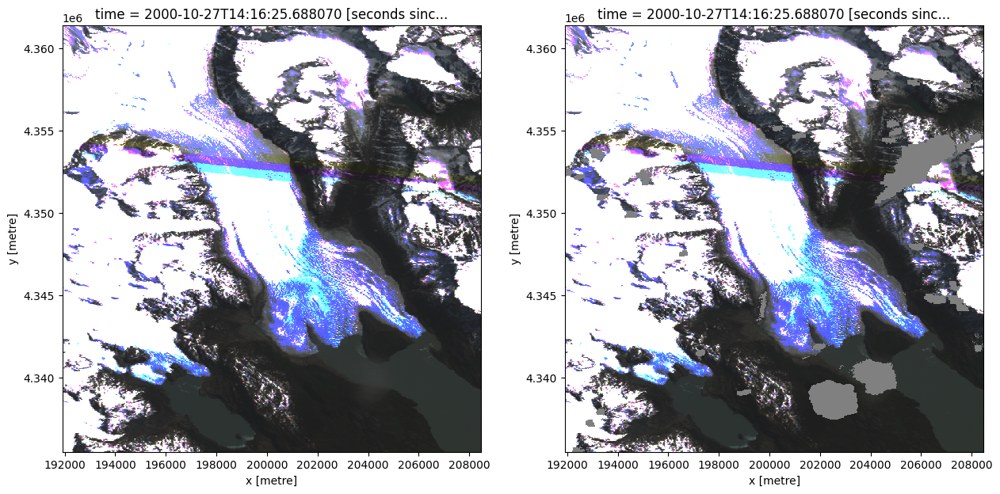

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
n_img = 2
img = ds_RAW[["red", "green", "blue"]].isel(time=n_img).squeeze().to_array()
img.plot.imshow(vmin=0, vmax=np.percentile(img, 90), robust=True, ax = ax[0])
ds_clean[["red", "green", "blue"]].isel(time=n_img).squeeze().to_array().plot.imshow(vmin=0, vmax=np.percentile(img, 90), robust=True, ax = ax[1])
ax[1].set_facecolor("grey")

In [13]:
ds_clean_norm = (ds_clean * 0.0000275 + -0.2)
ds_RAW_norm = (ds_RAW * 0.0000275 + -0.2)

In [14]:
swir16 = interpolate_nan_vertical(ds_RAW_norm['swir16'].values)
green = interpolate_nan_vertical(ds_RAW_norm['green'].values)
blue = xr.DataArray(interpolate_nan_vertical(ds_RAW_norm['blue'].values), coords={'time': ds_RAW_norm['red'].time,'y': ds_RAW_norm['red'].y,'x': ds_RAW_norm['red'].x}, dims=["time", "y", "x"])
blue.attrs = ds_RAW_norm['red'].attrs

swir16_clean = interpolate_nan_vertical(ds_clean_norm['swir16'].values)
green_clean = interpolate_nan_vertical(ds_clean_norm['green'].values)
blue_clean = xr.DataArray(interpolate_nan_vertical(ds_clean_norm['blue'].values), coords={'time': ds_clean_norm['red'].time,'y': ds_clean_norm['red'].y,'x': ds_clean_norm['red'].x}, dims=["time", "y", "x"])
blue_clean.attrs = ds_clean_norm['red'].attrs

In [15]:
ds_SnowID_RAW = xr.DataArray((green - swir16) / (green + swir16), coords={'time': ds_RAW_norm['red'].time,'y': ds_RAW_norm['red'].y,'x': ds_RAW_norm['red'].x}, dims=["time", "y", "x"])
ds_SnowID_RAW.attrs = ds_RAW_norm['red'].attrs

ds_SnowID_clean = xr.DataArray((green_clean - swir16_clean) / (green_clean + swir16_clean), coords={'time': ds_RAW_norm['red'].time,'y': ds_RAW_norm['red'].y,'x': ds_RAW_norm['red'].x}, dims=["time", "y", "x"])
ds_SnowID_clean.attrs = ds_clean_norm['red'].attrs

In [16]:
ds_SnowID_RAW = ds_SnowID_RAW.where(ds_SnowID_RAW > 0.7).compute().where(blue > 0.2).compute()
ds_SnowID_clean = ds_SnowID_clean.where(ds_SnowID_clean > 0.7).compute().where(blue_clean > 0.2).compute()

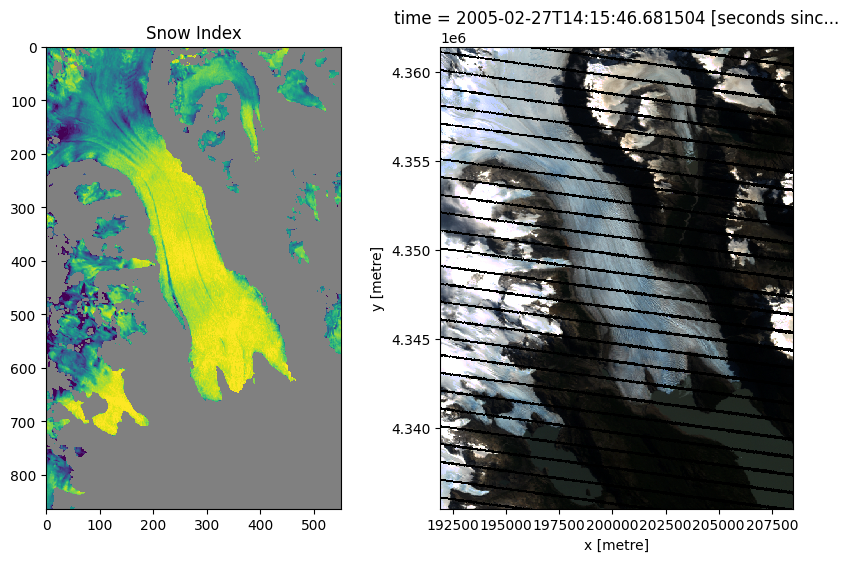

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(10, 6), gridspec_kw={'width_ratios':[1,1], 'height_ratios':[1]})

n_img = 14

img = ds_SnowID_RAW.isel(time=n_img)
ax[0].imshow(img, cmap='viridis', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
ax[0].set_title('Snow Index')
ax[0].set_facecolor("grey")
ax[0].set_facecolor("grey")

RGB_array = ds_RAW_norm[["red", "green", "blue"]].isel(time=n_img).to_array()
RGB_array.plot.imshow(vmin=0, vmax=1, ax=ax[1])
ax[1].set_facecolor("grey")

2000-02-07T14:12:40.120354000
2000-10-04T14:10:20.788829000
2000-10-27T14:16:25.688070000
2001-03-20T14:16:18.086409000
2001-05-07T14:16:07.750359000
2001-09-05T14:08:31.010008000
2001-10-14T14:14:19.202650000
2002-04-01T14:08:41.514032000
2002-04-08T14:14:55.212334000
2002-08-14T14:14:16.739073000
2002-11-02T14:13:56.827989000
2003-03-19T14:08:37.258991000
2004-03-12T14:15:20.774343000
2004-04-22T14:09:02.709703000
2005-02-27T14:15:46.681504000
2005-08-31T14:09:07.872816000
2005-10-02T14:08:59.610745000
2005-12-28T14:15:49.880729000
2006-05-05T14:16:09.955994000
2006-09-03T14:09:31.879391000
2007-09-13T14:15:55.443798000
2008-01-19T14:16:27.552656000
2010-03-29T14:18:18.053241000
2011-08-16T14:13:20.020714000
2012-10-12T14:21:47.730198000
2012-12-31T14:22:16.281026000
2013-01-16T14:22:15.113841000
2013-04-22T14:22:01.300813000
2013-10-31T14:22:10.276604000
2014-10-02T14:23:59.314106000
2014-10-18T14:24:08.108914000
2015-04-05T14:19:03.515793000
2015-04-12T14:25:18.502016000
2015-08-02

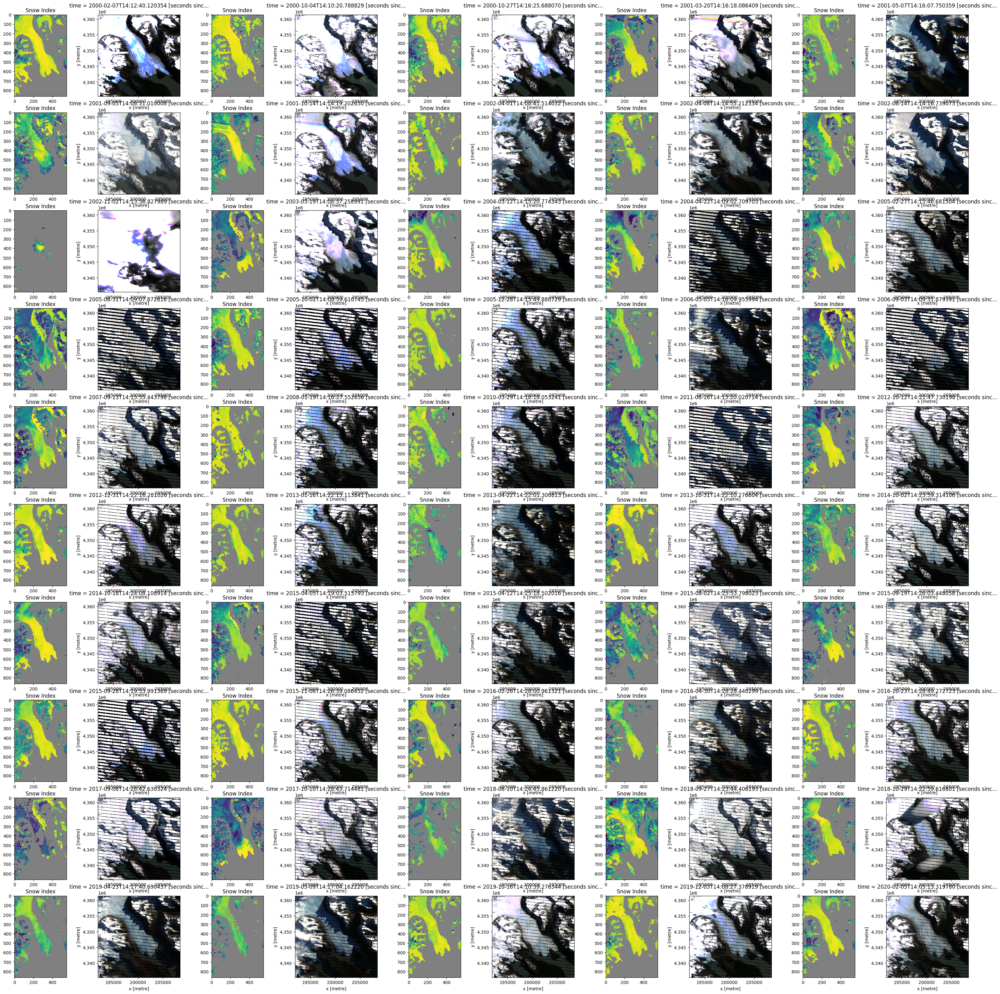

In [18]:
#Parametros del grafico
T = len(ds_SnowID_RAW['time']) # Numero de imagenes
nx = 10                         # Numero de filas 
large_img = nx*4                # Tamano de la imagen
ny = T//nx                     # Numero de columnas

len_x = len(ds_SnowID_RAW['x'])
len_y = len(ds_SnowID_RAW['y'])
razon = len_y/len_x
fig, ax = plt.subplots(nx, ny*2, figsize=(np.round(large_img), large_img), gridspec_kw={'width_ratios':[1,1]*ny, 'height_ratios':[1]*nx})

for i in range(nx):
    for j in range(ny):
        img = ds_SnowID_RAW.isel(time=i*ny + j)
        print(img['time'].values)
        ax[i, j*2].imshow(img, cmap='viridis', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
        ax[i, j*2].set_title('Snow Index')
        ax[i, j*2].set_facecolor("grey")
        ax[i, j*2].set_facecolor("grey")

        RGB_array = ds_RAW_norm[["red", "green", "blue"]].isel(time=i*ny+j).to_array()
        RGB_array.plot.imshow(vmin=0, vmax=1, ax=ax[i, j*2+1])
        ax[i, j*2+1].set_facecolor("grey")
        
#plt.savefig('plots/images_used_SI5_B2.png')

In [19]:
T = len(ds_SnowID_RAW['time'])

In [20]:
bool_Xarray = ds_SnowID_clean >0


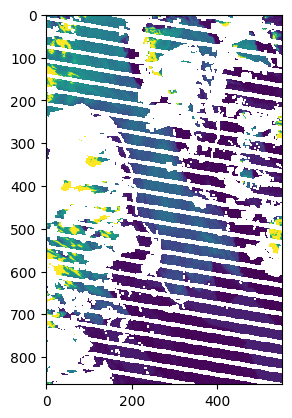

In [31]:
plt.imshow(ds_clean['red'].isel(time=14).values)

In [26]:
provisori = ds_clean['red']

In [27]:
data_filled = provisori.where(bool_Xarray, other=1) # no glacier
output = data_filled.where(~bool_Xarray, other=0)  # glacier
string_output = output.where(cloud_free_mask1.sel(time=observations_to_keep), other=2) # other

In [28]:
if 'units' in ds_RAW_norm.time.attrs:
    del ds_RAW_norm.time.attrs['units']
    
if 'units' in string_output.time.attrs:
    del string_output.time.attrs['units']

ds_RAW_norm['red'].to_netcdf("datos_training/RED_LANDSAT7.nc")
ds_RAW_norm['green'].to_netcdf("datos_training/GREEN_LANDSAT7.nc")
ds_RAW_norm['blue'].to_netcdf("datos_training/BLUE_LANDSAT7.nc")
ds_RAW_norm['nir08'].to_netcdf("datos_training/NIR_LANDSAT7.nc")
string_output.to_netcdf("datos_training/BOOL_LANDSAT7.nc")


/env/lib/python3.10/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 106.02 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


/env/lib/python3.10/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 105.56 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


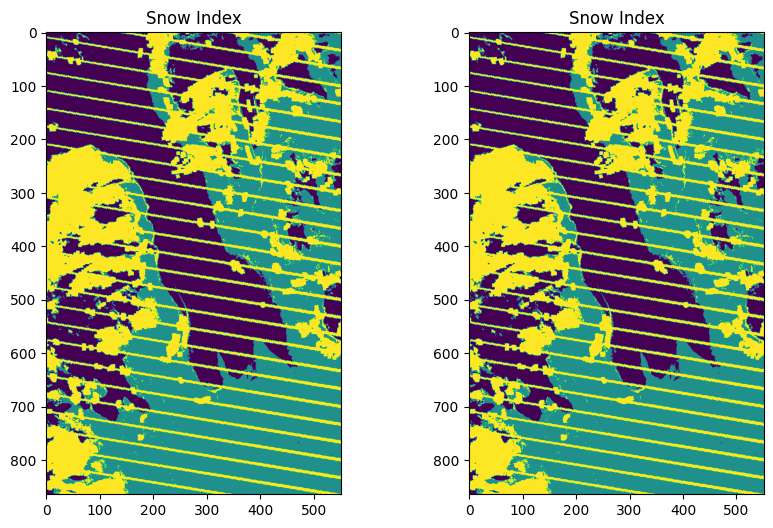

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(10, 6), gridspec_kw={'width_ratios':[1,1], 'height_ratios':[1]})

n_img = 14

img = string_output.isel(time=n_img)
ax[0].imshow(img, cmap='viridis', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
ax[0].set_title('Snow Index')
ax[0].set_facecolor("grey")
ax[0].set_facecolor("grey")


img = string_output.isel(time=n_img)
ax[1].imshow(img, cmap='viridis', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
ax[1].set_title('Snow Index')
ax[1].set_facecolor("grey")
ax[1].set_facecolor("grey")

In [80]:
red_values = []
green_values = []
blue_values = []
nir_values = []
string_values = []

for t, time in enumerate(ds_RAW_norm['time']):
    red = ds_RAW_norm['red'].sel(time=time).squeeze().values.ravel().tolist()
    green = ds_RAW_norm['green'].sel(time=time).squeeze().values.ravel().tolist()
    blue = ds_RAW_norm['blue'].sel(time=time).squeeze().values.ravel().tolist()
    nir = ds_RAW_norm['nir08'].sel(time=time).squeeze().values.ravel().tolist()
    is_glacier = string_output.sel(time=time).squeeze().values.ravel().tolist()
    string_values += is_glacier
    red_values += red
    green_values += green
    blue_values += blue
    nir_values += nir

/env/lib/python3.10/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 52.80 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/env/lib/python3.10/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 52.79 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


In [81]:
data = {'red': red_values,
        'green': green_values,
        'blue': blue_values,
        'nir': nir_values, 
        'glacier': string_values}

df = pd.DataFrame(data)

In [82]:
df.head()

,red,green,blue,nir,glacier
0,1.602212,1.602212,1.602212,0.563318,2.0
1,1.602212,1.602212,1.602212,0.603715,2.0
2,1.602212,1.602212,1.602212,0.699360,2.0
3,1.602212,1.602212,1.602212,1.602212,2.0
4,1.602212,1.602212,1.602212,0.714678,2.0


In [83]:
df.to_csv('datos_training/matrix_SI7_B2.csv')
pix_glacier = np.sum(df['glacier'])/len(df)
print(f'Porcentaje de pixeles que correspondena a glaciar: {pix_glacier*100}%')

Porcentaje de pixeles que correspondena a glaciar: 84.02795491721731%


In [38]:
ds['red'].sel(time='2004-04-22T14:09:02.709703000').values

array([[    0,     0,     0, ...,     0,     0,     0],
       [    0,     0,     0, ...,     0,     0,     0],
       [    0,     0,     0, ...,     0,     0,     0],
       ...,
       [33284, 33464, 33284, ...,  7985,  7985,  7985],
       [32939, 33644, 33464, ...,  7985,  7794,  7794],
       [    0,     0, 33284, ...,  7985,  7794,  7985]], dtype=uint16)

In [39]:
ds['red'].isel(time=14).values == 0

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [41]:
a = ds['red'].sel(time='2004-04-22T14:09:02.709703000').values == np.nan
b = np.sum(a)
print(b)

0


Borrar filas faltantes

In [17]:
import xarray as xr
import numpy as np

def fill_missing_with_median_xarray(data):
    filled_data = data.copy()  # Copiar los datos para no modificar los originales
    
    # Iterar sobre cada celda del DataArray
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            if np.isnan(data[i, j]):  # Si el valor es faltante (NaN)
                neighbors = []  # Lista para almacenar los valores vecinos
                
                # Obtener los valores de los vecinos (arriba, abajo, izquierda, derecha)
                if i > 0 and not np.isnan(data[i - 1, j]):
                    neighbors.append(data[i - 1, j])  # Vecino superior
                if i < data.shape[0] - 1 and not np.isnan(data[i + 1, j]):
                    neighbors.append(data[i + 1, j])  # Vecino inferior
                if j > 0 and not np.isnan(data[i, j - 1]):
                    neighbors.append(data[i, j - 1])  # Vecino izquierdo
                if j < data.shape[1] - 1 and not np.isnan(data[i, j + 1]):
                    neighbors.append(data[i, j + 1])  # Vecino derecho
                
                # Calcular la mediana de los vecinos y asignarla al valor faltante
                if neighbors:
                    filled_data[i, j] = np.median(neighbors)
    
    return filled_data


# Aplicar la función para rellenar datos faltantes con la mediana
filled_data_array_median = fill_missing_with_median_xarray(ds_RAW_norm)
print(filled_data_array_median)

import xarray as xr
import numpy as np

def fill_missing_with_median_xarray(data_array):
    filled_data = data_array.copy()  # Copiar los datos para no modificar los originales
    
    # Iterar sobre cada celda del DataArray
    for i in range(data_array.shape[0]):
        for j in range(data_array.shape[1]):
            if np.isnan(data_array[i, j]):  # Si el valor es faltante (NaN)
                neighbors = []  # Lista para almacenar los valores vecinos
                
                # Obtener los valores de los vecinos (arriba, abajo, izquierda, derecha)
                if i > 0 and not np.isnan(data_array[i - 1, j]):
                    neighbors.append(data_array[i - 1, j])  # Vecino superior
                if i < data_array.shape[0] - 1 and not np.isnan(data_array[i + 1, j]):
                    neighbors.append(data_array[i + 1, j])  # Vecino inferior
                if j > 0 and not np.isnan(data_array[i, j - 1]):
                    neighbors.append(data_array[i, j - 1])  # Vecino izquierdo
                if j < data_array.shape[1] - 1 and not np.isnan(data_array[i, j + 1]):
                    neighbors.append(data_array[i, j + 1])  # Vecino derecho
                
                # Calcular la mediana de los vecinos y asignarla al valor faltante
                if neighbors:
                    filled_data[i, j] = np.median(neighbors)
    
    return filled_data

# Crear un Dataset de ejemplo con un DataArray llamado 'ds_RAW_norm'
# Asegúrate de tener un DataArray con valores faltantes (NaN) para probar la función de relleno
data_array = np.array([[1, 2, np.nan], [4, np.nan, 6], [np.nan, 8, 9]])
ds_RAW_norm = xr.DataArray(ds_RAW_norm, dims=('dim1', 'dim2'))

# Aplicar la función para rellenar datos faltantes con la mediana
filled_data_array_median = fill_missing_with_median_xarray(ds_RAW_norm)
print(filled_data_array_median)



AttributeError: 'Dataset' object has no attribute 'shape'